In [113]:
#libraries Import
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import chardet
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn import linear_model, metrics
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.decomposition import PCA
from sklearn.decomposition import IncrementalPCA
from sklearn import preprocessing
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from IPython.display import Image  
from sklearn.metrics import roc_auc_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import Pipeline
import os
from sklearn.model_selection import KFold

# To hide warnings
import warnings
warnings.filterwarnings('ignore')
# To view all the columns
pd.set_option("display.max_columns", 250)

In [114]:
#Detecting the encoding type
with open("telecom_churn_data.csv", 'rb') as rawdata:
    enconding_type = chardet.detect(rawdata.read(1000))['encoding']
    print("telecom_churn_data.csv encoding type is" ,enconding_type)

telecom_churn_data.csv encoding type is ascii


In [115]:
df_telecom_churn = pd.read_csv("telecom_churn_data.csv")
df_telecom_churn.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [116]:
df_telecom_churn.shape

(99999, 226)

In [117]:
df_telecom_churn.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 226 columns):
 #   Column                    Dtype  
---  ------                    -----  
 0   mobile_number             int64  
 1   circle_id                 int64  
 2   loc_og_t2o_mou            float64
 3   std_og_t2o_mou            float64
 4   loc_ic_t2o_mou            float64
 5   last_date_of_month_6      object 
 6   last_date_of_month_7      object 
 7   last_date_of_month_8      object 
 8   last_date_of_month_9      object 
 9   arpu_6                    float64
 10  arpu_7                    float64
 11  arpu_8                    float64
 12  arpu_9                    float64
 13  onnet_mou_6               float64
 14  onnet_mou_7               float64
 15  onnet_mou_8               float64
 16  onnet_mou_9               float64
 17  offnet_mou_6              float64
 18  offnet_mou_7              float64
 19  offnet_mou_8              float64
 20  offnet_mou_9              f

In [118]:
df_telecom_churn.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.0,96140.0,94621.0,92254.0,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621

### Observations 
Looking at the data, we can clearly see:
 - columns for identification-id purposes are:
     - mobile_number
     - cirlce_id
 - the following are identified data columns:
     - last_date_of_month_6
     - last_date_of_month_7
     - last_date_of_month_8
     - last_date_of_month_9
     - date_of_last_rech_6
     - date_of_last_rech_7
     - date_of_last_rech_8
     - date_of_last_rech_9
     - date_of_last_rech_data_6
     - date_of_last_rech_data_7
     - date_of_last_rech_data_8
     - date_of_last_rech_data_9
 - the following are identified category cols:
     - night_pck_user_6
     - night_pck_user_7
     - night_pck_user_8
     - night_pck_user_9
     - fb_user_6
     - fb_user_7
     - fb_user_8
     - fb_user_9
 - Left out columns are numerical cols

### Handling missing values

In [119]:
# preserving the original dataframe
df_telecom_churn_orig = df_telecom_churn

#### Dropping the date cols and the id cols

In [120]:
# id and date cols
id_cols = ['mobile_number', 'circle_id']
date_cols = ['last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8','last_date_of_month_9',
             'date_of_last_rech_6', 'date_of_last_rech_7','date_of_last_rech_8', 'date_of_last_rech_9',
             'date_of_last_rech_data_6', 'date_of_last_rech_data_7', 'date_of_last_rech_data_8',
             'date_of_last_rech_data_9'
            ]

In [121]:
df_telecom_churn = df_telecom_churn.drop(id_cols + date_cols, axis=1)

In [122]:
df_telecom_churn.shape

(99999, 212)

In [123]:
#Defining a function to check the null values in data frame and return the missing values percentage of columns
#which have atlease 1 missing value
def telecom_churn_null_percentge(df):
    missing = round((df.isnull().sum()/len(df.index))*100,2)
    missing = missing[missing > 0]
    return missing

In [124]:
#Percentage Share
def percent_share(col,val):
      return round((len(df_telecom_churn[df_telecom_churn[col] == val])/len(df_telecom_churn.index))*100,2)

In [125]:
telecom_churn_null_percentge(df_telecom_churn).sort_values(ascending=False)

count_rech_3g_6       74.85
av_rech_amt_data_6    74.85
fb_user_6             74.85
total_rech_data_6     74.85
count_rech_2g_6       74.85
                      ...  
loc_og_t2m_mou_7       3.86
std_og_mou_7           3.86
loc_ic_t2o_mou         1.02
std_og_t2o_mou         1.02
loc_og_t2o_mou         1.02
Length: 155, dtype: float64

### imputing numerical columns

In [126]:
# For recharge related columns, we can see the if there are NAs, that means the user has not recharged
# So, we can impute such columns with 0
recharge_cols = ['total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8', 'total_rech_data_9', 
            'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8', 'max_rech_data_9', 
            'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8', 'count_rech_2g_9', 
            'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8', 'count_rech_3g_9',
            'av_rech_amt_data_6','av_rech_amt_data_7','av_rech_amt_data_8','av_rech_amt_data_9']

In [127]:
# Also, revenue metrics (arpu) with NAs would also mean 0 revenue and hence we can impute it with 0 as well
revenue_cols = ['arpu_3g_6', 'arpu_3g_7', 'arpu_3g_8', 'arpu_3g_9', 
                'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8', 'arpu_2g_9']

In [128]:
num_cols_fill_na = recharge_cols + revenue_cols

In [129]:
# replacing rechange cols and revenue cols NAs with 0
df_telecom_churn[num_cols_fill_na] = df_telecom_churn[num_cols_fill_na].apply(lambda x: x.fillna(0))

In [130]:
#df_telecom_churn[num_cols_fill_na].isnull().sum()*100/len(df_telecom_churn.index)*100
telecom_churn_null_percentge(df_telecom_churn[num_cols_fill_na])

Series([], dtype: float64)

### imputing categorical columns

In [131]:
cat_cols = ['night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8', 'night_pck_user_9', 
            'fb_user_6', 'fb_user_7', 'fb_user_8', 'fb_user_9']

In [132]:
# we can fill the categorical columns with an additional category represented by -1
df_telecom_churn[cat_cols] = df_telecom_churn[cat_cols].apply(lambda x: x.fillna(-1))

In [133]:
#df_telecom_churn[cat_cols].isnull().sum()*100/len(df_telecom_churn.index)*100
telecom_churn_null_percentge(df_telecom_churn[cat_cols])

Series([], dtype: float64)

### dropping columns if NAs > 70%

In [134]:
#telecom_churn_null_percentge(df_telecom_churn).sort_values(ascending=False)
telecom_churn_null_percentge(df_telecom_churn).sort_values(ascending=False)

ic_others_9         7.75
roam_og_mou_9       7.75
std_ic_t2t_mou_9    7.75
loc_og_t2t_mou_9    7.75
loc_ic_mou_9        7.75
                    ... 
loc_ic_mou_7        3.86
loc_og_t2m_mou_7    3.86
loc_ic_t2o_mou      1.02
std_og_t2o_mou      1.02
loc_og_t2o_mou      1.02
Length: 119, dtype: float64

We can see that there are no columns with very high NAs that we might have to drop any columns

In [135]:
df_telecom_churn.shape

(99999, 212)

We will be going ahead with imputation of missing values with KNNImputer

In [136]:
from sklearn import impute
from sklearn.impute import KNNImputer

In [137]:
imputer = KNNImputer(n_neighbors=2)
df_transf  = imputer.fit_transform(df_telecom_churn)

In [138]:
# Output is an nd array and not a dataframe - we need to convert it to a dataframe 
df_tel_churn = pd.DataFrame(df_transf, columns=df_telecom_churn.columns)

In [139]:
df_tel_churn.shape

(99999, 212)

In [140]:
df_tel_churn.isnull().sum()*100/len(df_tel_churn.index)*100

loc_og_t2o_mou    0.0
std_og_t2o_mou    0.0
loc_ic_t2o_mou    0.0
arpu_6            0.0
arpu_7            0.0
                 ... 
aon               0.0
aug_vbc_3g        0.0
jul_vbc_3g        0.0
jun_vbc_3g        0.0
sep_vbc_3g        0.0
Length: 212, dtype: float64

### Filtering high value customers

### We need to find the customers whose recharge amounts are > than  70th percentile of average total recharge amount

In [141]:
df_tel_churn.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 212 columns):
 #   Column              Dtype  
---  ------              -----  
 0   loc_og_t2o_mou      float64
 1   std_og_t2o_mou      float64
 2   loc_ic_t2o_mou      float64
 3   arpu_6              float64
 4   arpu_7              float64
 5   arpu_8              float64
 6   arpu_9              float64
 7   onnet_mou_6         float64
 8   onnet_mou_7         float64
 9   onnet_mou_8         float64
 10  onnet_mou_9         float64
 11  offnet_mou_6        float64
 12  offnet_mou_7        float64
 13  offnet_mou_8        float64
 14  offnet_mou_9        float64
 15  roam_ic_mou_6       float64
 16  roam_ic_mou_7       float64
 17  roam_ic_mou_8       float64
 18  roam_ic_mou_9       float64
 19  roam_og_mou_6       float64
 20  roam_og_mou_7       float64
 21  roam_og_mou_8       float64
 22  roam_og_mou_9       float64
 23  loc_og_t2t_mou_6    float64
 24  loc_og_t2t_mou_7    float64

In [142]:
# We need to calculate first the total data recharge amounts for 6th and 7th months 
# total data recharge amount = total no. of recharges * avg amount per recharge
df_tel_churn['total_Data_recharge_6'] = df_tel_churn.total_rech_data_6 * df_tel_churn.av_rech_amt_data_6
df_tel_churn['total_Data_recharge_7'] = df_tel_churn.total_rech_data_7 * df_tel_churn.av_rech_amt_data_7

In [143]:
# Adding the total Data recharge to the total calling recharge amount for calling
df_tel_churn['Total_Recharge_Amount_6'] = df_tel_churn['total_rech_amt_6'] + df_tel_churn['total_Data_recharge_6']
df_tel_churn['Total_Recharge_Amount_7'] = df_tel_churn['total_rech_amt_7'] + df_tel_churn['total_Data_recharge_7']


In [144]:
# avg recharge amount in june/
df_tel_churn['Avg_recharge_6_7'] = (df_tel_churn['Total_Recharge_Amount_6'] + df_tel_churn['Total_Recharge_Amount_7'])/2

In [145]:
df_tel_churn.shape

(99999, 217)

In [146]:
# We need to filter out customers whose recharge amount is greater than 70 percentile of the Average recharge amount
df_tel_churn_70 = df_tel_churn[df_tel_churn['Avg_recharge_6_7']>= df_tel_churn['Avg_recharge_6_7'].quantile(0.7) ]

In [147]:
df_tel_churn_70.shape

(30001, 217)

In [148]:
# We now have the 70th percentile information that was required - we can now drop the derived columns
df_tel_churn_70.drop(['total_Data_recharge_6', 'total_Data_recharge_7','Total_Recharge_Amount_6', 
                       'Total_Recharge_Amount_7', 'Avg_recharge_6_7'], axis = 1, inplace = True)


In [149]:
df_tel_churn_70.reset_index(drop=True)
df_tel_churn_70.shape

(30001, 212)

## Derving new variables which show the usage difference <br>
Current Month(i.e 8) - Previous Last 2 Months(i.e 6,7)

In [150]:
#Bulding a custom function to calculate the dervied colum for a list of columns which we pass
def cal_diff(l):
    for x in l:
        diff_col = x + '_diff'
        col_8 = x +'_8'
        #print(col_8)
        col_7 = x +'_7'
        #print(col_7)
        col_6 = x +'_6'
        #print(col_6)
        df_tel_churn_70[diff_col] = df_tel_churn_70[col_8] - ((df_tel_churn_70[col_7] + df_tel_churn_70[col_6])/2)

In [151]:
#Passing the required columns for the caluclaiton of derived diff columns
cal_diff(['arpu','onnet_mou','offnet_mou','roam_ic_mou','roam_og_mou','loc_og_mou','std_og_mou',
          'isd_og_mou','spl_og_mou','total_og_mou','loc_ic_mou','std_ic_mou','isd_ic_mou','spl_ic_mou',
          'total_ic_mou','total_rech_num','total_rech_amt','max_rech_amt','total_rech_data','max_rech_data',
          'av_rech_amt_data','vol_2g_mb','vol_3g_mb'
         ])

In [152]:
df_tel_churn_70.shape

(30001, 235)

In the 9th Month if the subscriber hasn't used any data or voice it can be considered that the subscriber has churned.<br>
It means if 2g data usage and 3g data usage and sum of incoming minutes and sum of outgoing minutes of usage is 0 then it means the user has churned.

We will create new column churn which would indicate whether the subscriber has churned or not. 

In [153]:
df_tel_churn_70['TotUsage']=df_tel_churn_70['total_ic_mou_9']+df_tel_churn_70['total_og_mou_9']+df_tel_churn_70['vol_2g_mb_9'] + df_tel_churn_70['vol_3g_mb_9']
df_tel_churn_70['churn']=df_tel_churn_70.apply(lambda x: 1 if x.TotUsage==0 else 0, axis=1)

In [154]:
#Removing column TotUsage as we no longer require it
df_tel_churn_70.drop('TotUsage', axis=1, inplace=True)

In [155]:
df_tel_churn_70.head()

,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_diff,onnet_mou_diff,offnet_mou_diff,roam_ic_mou_diff,roam_og_mou_diff,loc_og_mou_diff,std_og_mou_diff,isd_og_mou_diff,spl_og_mou_diff,total_og_mou_diff,loc_ic_mou_diff,std_ic_mou_diff,isd_ic_mou_diff,spl_ic_mou_diff,total_ic_mou_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,total_rech_data_diff,max_rech_data_diff,av_rech_amt_data_diff,vol_2g_mb_diff,vol_3g_mb_diff,churn
0,0.0,0.0,0.0,197.385,214.816,213.803,21.100,0.355,9.825,0.00,6.585,0.445,21.635,0.00,27.835,0.00,0.00,0.00,3.945,0.00,0.00,0.00,18.64,0.355,9.635,0.00,3.155,0.445,18.055,0.00,10.475,0.00,0.00,0.00,0.00,0.0,0.0,0.00,1.13,0.805,27.695,0.00,13.635,0.00,0.19,0.00,0.000,0.00,3.52,0.00,0.000,0.00,0.00,0.00,0.000,0.0,0.0,0.0,0.0,0.00,3.71,0.00,0.000,0.0,0.00,0.00,1.005,0.0,0.055,0.00,1.14,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.455,1.19,0.16,0.755,4.455,12.42,4.13,4.635,0.405,0.00,1.15,0.00,5.32,13.615,5.44,5.395,0.00,0.00,0.

For us the predictions must be done on the 9th month , so we will be dropping the columns related to that month.

In [156]:
df_tel_churn_70_bk = df_tel_churn_70
df_tel_churn_70_bk=df_tel_churn_70_bk.filter(regex=r'^((?!_9).)*$')
df_tel_churn_70_bk.shape

(30001, 185)

### Exploratory Data Analysis and Visualization

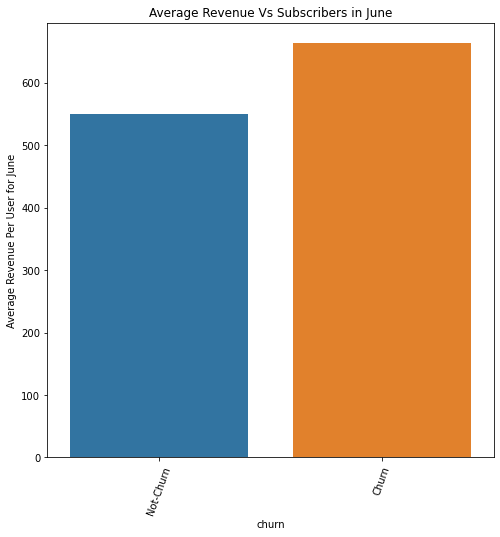

In [157]:
plt.figure(figsize=(8,8))
ax1 = sns.barplot(x='churn', y='mean', data=df_tel_churn_70.groupby('churn')['arpu_6'].agg(['mean']).reset_index())
ax1.set_xticklabels(['Not-Churn', 'Churn'],rotation=70)
ax1.set_ylabel('Average Revenue Per User for June')
plt.title('Average Revenue Vs Subscribers in June')
plt.show()

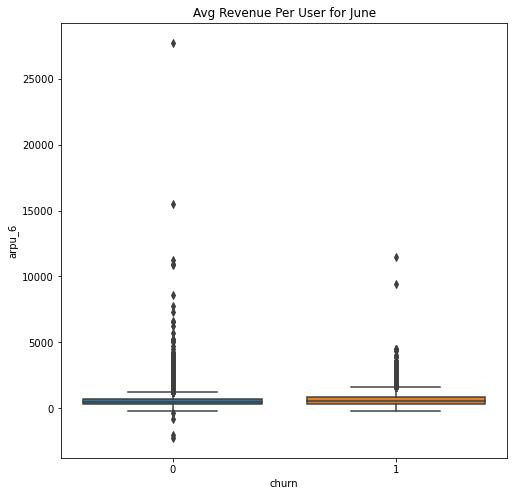

In [158]:
#Box Plot
plt.figure(figsize=(8,8))
sns.boxplot(x='churn',y='arpu_6', data=df_tel_churn_70)
plt.title("Avg Revenue Per User for June")
plt.show()

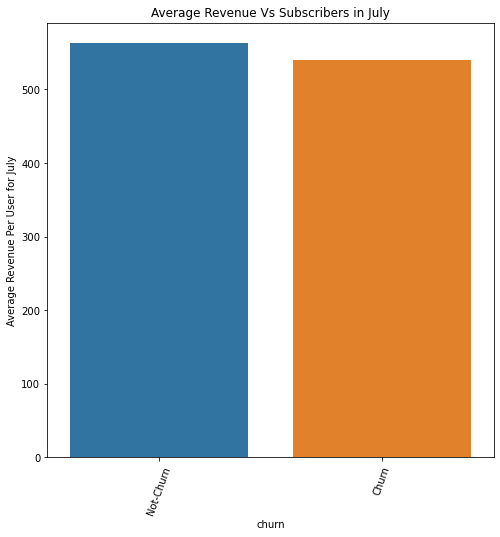

In [159]:
plt.figure(figsize=(8,8))
ax2 = sns.barplot(x='churn', y='mean', data=df_tel_churn_70.groupby('churn')['arpu_7'].agg(['mean']).reset_index())
ax2.set_xticklabels(['Not-Churn', 'Churn'],rotation=70)
ax2.set_ylabel('Average Revenue Per User for July')
plt.title('Average Revenue Vs Subscribers in July')
plt.show()

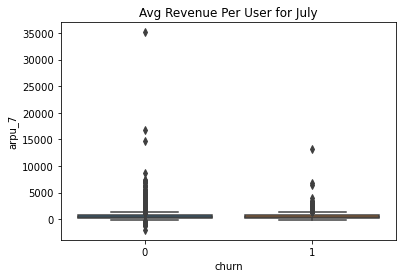

In [160]:
#Box Plot
sns.boxplot(x='churn',y='arpu_7', data=df_tel_churn_70)
plt.title("Avg Revenue Per User for July")
plt.show()

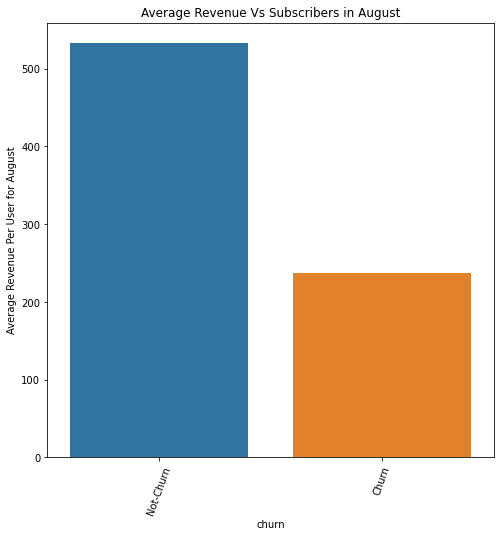

In [161]:
plt.figure(figsize=(8,8))
ax3 = sns.barplot(x='churn', y='mean', data=df_tel_churn_70.groupby('churn')['arpu_8'].agg(['mean']).reset_index())
ax3.set_xticklabels(['Not-Churn', 'Churn'],rotation=70)
ax3.set_ylabel('Average Revenue Per User for August')
plt.title('Average Revenue Vs Subscribers in August')
plt.show()

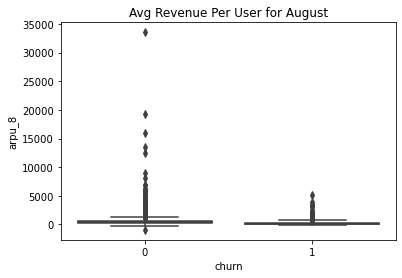

In [162]:
#Box Plot
sns.boxplot(x='churn',y='arpu_8', data=df_tel_churn_70)
plt.title("Avg Revenue Per User for August")
plt.show()

ARPU is less than 8th Month than 6th and 7th Month

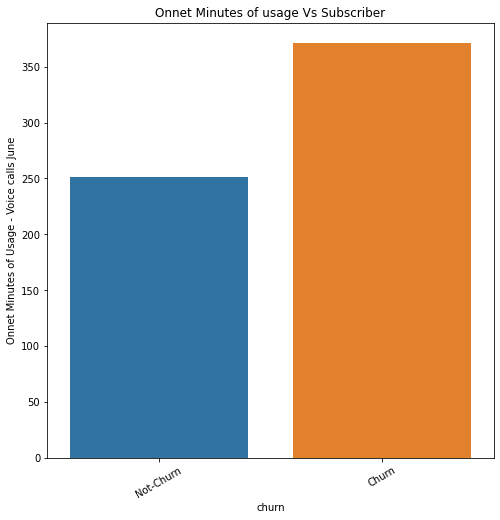

In [163]:
plt.figure(figsize=(8,8))
ax4 = sns.barplot(x='churn', y='mean', data=df_tel_churn_70.groupby('churn')['onnet_mou_6'].agg(['mean']).reset_index())
ax4.set_xticklabels(['Not-Churn', 'Churn'],rotation=30)
ax4.set_ylabel('Onnet Minutes of Usage - Voice calls June')
plt.title('Onnet Minutes of usage Vs Subscriber')
plt.show()

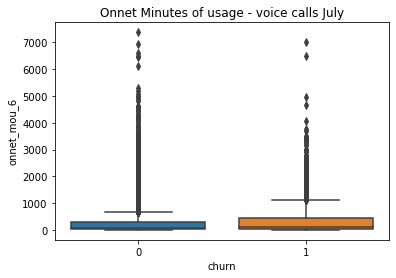

In [164]:
#Box plot
sns.boxplot(x='churn',y='onnet_mou_6', data=df_tel_churn_70)
#plt.yscale('log')
plt.title("Onnet Minutes of usage - voice calls July")
plt.show()

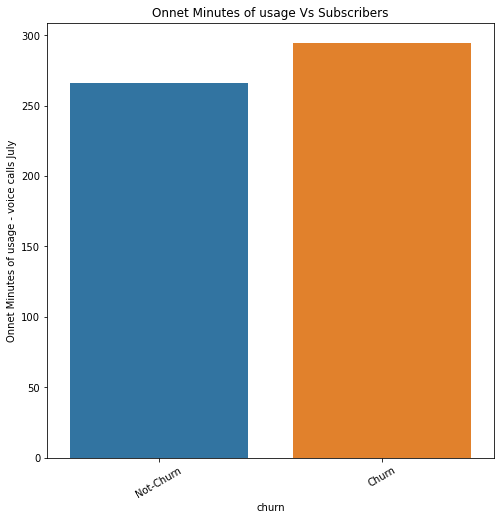

In [165]:
plt.figure(figsize=(8,8))
ax5 = sns.barplot(x='churn', y='mean', data=df_tel_churn_70.groupby('churn')['onnet_mou_7'].agg(['mean']).reset_index())
ax5.set_xticklabels(['Not-Churn', 'Churn'],rotation=30)
ax5.set_ylabel('Onnet Minutes of usage - voice calls July')
plt.title('Onnet Minutes of usage Vs Subscribers')
plt.show()

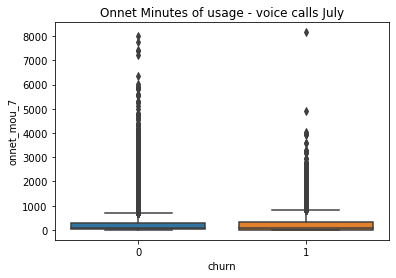

In [166]:
#Box plot
sns.boxplot(x='churn',y='onnet_mou_7', data=df_tel_churn_70)
plt.title("Onnet Minutes of usage - voice calls July")
plt.show()

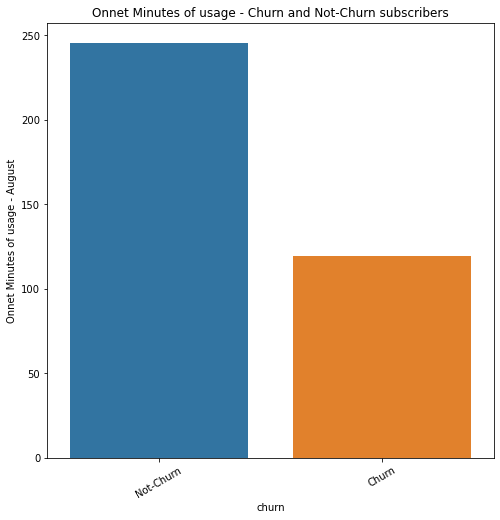

In [167]:
plt.figure(figsize=(8,8))
ax6 = sns.barplot(x='churn', y='mean', data=df_tel_churn_70.groupby('churn')['onnet_mou_8'].agg(['mean']).reset_index())
ax6.set_xticklabels(['Not-Churn', 'Churn'],rotation=30)
ax6.set_ylabel('Onnet Minutes of usage - August')
plt.title('Onnet Minutes of usage - Churn and Not-Churn subscribers')
plt.show()

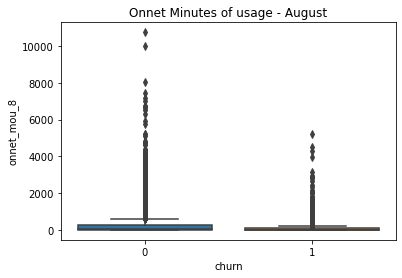

In [168]:
sns.boxplot(x='churn',y='onnet_mou_8', data=df_tel_churn_70)
plt.title("Onnet Minutes of usage - August")
plt.show()

Removing outliers

In [169]:
df_tel_churn_main_70 = df_tel_churn_70.drop(df_tel_churn_70.loc[(df_tel_churn_70['churn'] == 0) & (
    (df_tel_churn_70['arpu_6'] > 15000) | 
    (df_tel_churn_70['arpu_7'] > 20000) | 
    (df_tel_churn_70['arpu_8'] > 20000) )].index)

Let's see the subscriber churn percentage

In [170]:
churn_percent = (sum(df_tel_churn_main_70['churn'])/len(df_tel_churn_main_70['churn'].index))*100
churn_percent

8.136937897929931

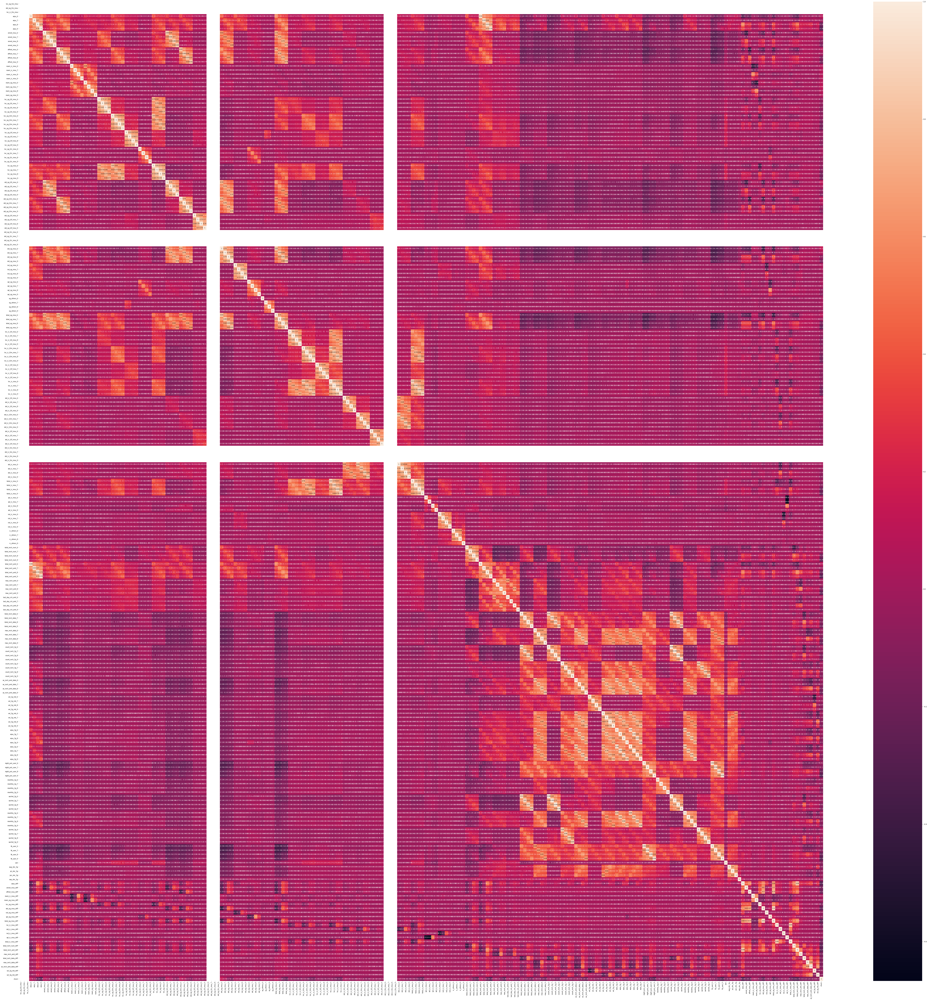

In [171]:
#check correlation matrix
plt.figure(figsize = (120,120))    
sns.heatmap(df_tel_churn_main_70.corr(),annot = True)
plt.show()

### Modelling

Splitting data into train and test data

In [172]:
X = df_tel_churn_main_70.drop(['churn'],axis=1)
y = df_tel_churn_main_70.churn
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.30,random_state=100, stratify=y)

In [173]:
pca = PCA(svd_solver='randomized', random_state=42)

In [174]:
pca.fit(X_train)

PCA(random_state=42, svd_solver='randomized')

In [175]:
pca.components_

array([[-9.83252629e-17,  2.22044605e-16, -2.77555756e-17, ...,
         6.75573440e-03,  6.00462152e-03,  8.92013289e-03],
       [-1.86476528e-17, -8.32667268e-17,  2.22044605e-16, ...,
         4.99788012e-03,  3.14280091e-03,  4.35092038e-02],
       [ 1.18011258e-18, -2.25514052e-17, -1.11022302e-16, ...,
        -1.17376360e-02, -5.37375405e-03, -2.99551005e-02],
       ...,
       [ 0.00000000e+00, -5.17302326e-03, -7.64279841e-03, ...,
        -3.20060467e-04, -8.35466802e-04,  5.78169623e-04],
       [ 0.00000000e+00, -1.37239203e-02,  1.55108638e-02, ...,
        -3.77690620e-03, -3.24239424e-04,  4.28677979e-04],
       [ 9.99999607e-01, -1.29648167e-05, -7.26557295e-05, ...,
        -7.02362347e-05,  2.73859900e-04,  2.26699556e-05]])

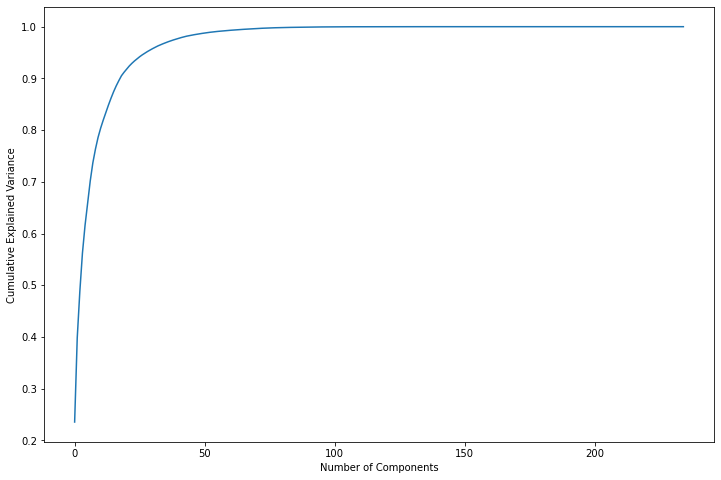

In [176]:
#Cumulative Variance Vs Number of Components
%matplotlib inline
fig = plt.figure(figsize = (12,8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.show()

In [177]:
print(np.cumsum(pca.explained_variance_ratio_))

[0.23537633 0.39817547 0.48808347 0.56209134 0.61575056 0.65940767
 0.70176377 0.73668992 0.76326286 0.78575697 0.80380772 0.81941677
 0.83422879 0.84843062 0.86188714 0.87445019 0.88571179 0.89574294
 0.90513759 0.91187895 0.91797257 0.92395033 0.92907007 0.9336922
 0.93782119 0.94189602 0.94553367 0.94880232 0.95197127 0.95488333
 0.95763683 0.96031563 0.96278327 0.96497681 0.96705966 0.96908216
 0.97096141 0.97273215 0.97440292 0.97599985 0.97752541 0.97898559
 0.98035095 0.98159584 0.98264433 0.98365174 0.98452442 0.98539602
 0.98623791 0.98702016 0.98779096 0.98849451 0.98915205 0.98976689
 0.99032449 0.990876   0.99135112 0.99180342 0.99224643 0.99267649
 0.99309419 0.99349178 0.99387691 0.99424625 0.9945794  0.99490678
 0.99522257 0.99553718 0.99583605 0.99612852 0.99640878 0.99668298
 0.99693634 0.9971674  0.99738124 0.99758786 0.99777197 0.9979264
 0.99807624 0.99821942 0.9983413  0.99845038 0.99854921 0.99864582
 0.99873241 0.99881776 0.99889922 0.99897724 0.99905283 0.999127

From the above list we can observe that 31 components are explaning 95% of the variance 0.95749293.

In [178]:
#we can now use incrementalPCA to proceed
pca_final = IncrementalPCA(n_components=31)
pca_final

IncrementalPCA(n_components=31)

In [179]:
pca_train = pca_final.fit_transform(X_train)
pca_train.shape

(20999, 31)

In [180]:
#Applying these components to the test data 
pca_test = pca_final.transform(X_test)
pca_test.shape

(9000, 31)

### Logistic Regression on the principal components

In [181]:
log_reg = LogisticRegression()
pca_model = log_reg.fit(pca_train,y_train)

In [182]:
#Predictions
y_pred_test = pca_model.predict_proba(pca_test)[:,1]
"{:2.4}".format(metrics.roc_auc_score(y_test, y_pred_test))

'0.9796'

In [183]:
pca_90 = PCA(0.90)
pca_train2 = pca_90.fit_transform(X_train)
pca_train2.shape

(20999, 19)

Here PCA would be using 19 components

In [184]:
log_reg_2 = LogisticRegression()
pca_model_2 = log_reg_2.fit(pca_train2,y_train)

In [185]:
pca_test_2 = pca_90.transform(X_test)
pca_test_2.shape

(9000, 19)

In [186]:
pred_2 = pca_model_2.predict_proba(pca_test_2)[:,1]
"{:2.4}".format(metrics.roc_auc_score(y_test, pred_2))

'0.9738'

In [187]:
pca_train = pca_train2
pca_test = pca_test_2

### Random Forest Model

In [188]:
rfc = RandomForestClassifier(class_weight={0:0.1, 1: 0.9}, n_jobs = -1)

# hyperparameters
params = {"criterion": ['gini', 'entropy'], "max_features": ['auto', 0.4]}

# num of folds = 5
folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 4)

#Gridsearch
model_RF = GridSearchCV(estimator=rfc, cv=folds, param_grid=params, scoring='roc_auc', n_jobs=-1, verbose=1)

In [189]:
model_RF.fit(X_train, y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 out of  20 | elapsed:  1.1min remaining:    7.6s
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:  1.2min finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
             estimator=RandomForestClassifier(class_weight={0: 0.1, 1: 0.9},
                                              n_jobs=-1),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_features': ['auto', 0.4]},
             scoring='roc_auc', verbose=1)

In [190]:
print("Best score: ", model_RF.best_score_)
print("Best hyperparameters: ", model_RF.best_params_)

Best score:  0.9999998484200825
Best hyperparameters:  {'criterion': 'gini', 'max_features': 0.4}


In [191]:
# making prediction on test data
pred = model_RF.predict(X_test)

In [192]:
print('classification report')
print(classification_report(y_test,pred))
print('confusion matrix')
print(confusion_matrix(y_test,pred))
print('accuracy score')
print(accuracy_score(y_test,pred))

# check area under curve
y_pred_prob = model_RF.predict_proba(X_test)[:, 1]
print("AUC") 
print(round(roc_auc_score(y_test, pred),2))

classification report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      8268
           1       1.00      1.00      1.00       732

    accuracy                           1.00      9000
   macro avg       1.00      1.00      1.00      9000
weighted avg       1.00      1.00      1.00      9000

confusion matrix
[[8266    2]
 [   0  732]]
accuracy score
0.9997777777777778
AUC
1.0


# Decision Tree Model

In [193]:
#Hyperparameter Tuning
# GridSearchCV to find optimal max_depth

# number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(1, 16)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")
tree.fit(pca_train, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=100),
             param_grid={'max_depth': range(1, 16)}, scoring='accuracy')

In [194]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.099537,0.004778,0.001605,0.000476,1,{'max_depth': 1},0.918571,0.918571,0.918571,0.918571,0.918790,0.918615,0.000088,12
1,0.180916,0.001850,0.001995,0.000003,2,{'max_depth': 2},0.919524,0.923571,0.915714,0.919048,0.918790,0.919329,0.002509,11
2,0.264318,0.010194,0.001946,0.000069,3,{'max_depth': 3},0.925000,0.927857,0.927857,0.927143,0.929031,0.927378,0.001334,3
3,0.363602,0.049219,0.001993,0.000006,4,{'max_depth': 4},0.925714,0.928571,0.927619,0.927619,0.926411,0.927187,0.001006,4
4,0.416485,0.008405,0.002186,0.000409,5,{'max_depth': 5},0.926905,0.929524,0.926667,0.926429,0.924744,0.926854,0.001536,5
5,0.478893,0.005601,0.002219,0.000386,6,{'max_depth': 6},0.923333,0.933095,0.927619,0.926667,0.930936,0.928330,0.003398,2
6,0.578626,0.039271,0.001992,0.000007,7,{'max_depth': 7},0.925714,0.931667,0.926667,0.928571,0.929745,0.928473,0.002131,1
7,0.619764,0.011612,0.002588,0.000455,8,{'max_depth': 8},0.922143,0.926905,0.925952,0.929762,0.927364,0.926425,0.002482,6
8,0.691351,0.007285,0.002224,0.000387,9,{'max_depth': 9},0.923095,0.924048,0.927857,0.923095,0.923791,0.924377,0.001780,7
9,0.936586,0.055944,0.003189,0.000960,10,{'max_depth': 10},0.922619,0.919524,0.924048,0.923333,0.923077,0.922520,0.001568,8


In [195]:
#Grid Search for optimal parameters
param_grid = {
    'max_depth': range(10, 16, 2),
    'min_samples_leaf': range(5, 15, 5),
    'min_samples_split': range(5, 15, 5),
    'criterion': ["entropy", "gini"]
     }

n_folds = 5

# Instantiate the grid search model
dtree = DecisionTreeClassifier()
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          cv = n_folds, verbose = 1)

# Fit the grid search to the data
grid_search.fit(pca_train,y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 120 out of 120 | elapsed:  1.9min finished


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_depth': range(10, 16, 2),
                         'min_samples_leaf': range(5, 15, 5),
                         'min_samples_split': range(5, 15, 5)},
             verbose=1)

In [196]:
cv_results = pd.DataFrame(grid_search.cv_results_)
print("best accuracy", grid_search.best_score_)
print(grid_search.best_estimator_)

best accuracy 0.9260917678812415
DecisionTreeClassifier(max_depth=10, min_samples_leaf=10, min_samples_split=10)


In [197]:
# model with optimal hyperparameters
opt_tree = DecisionTreeClassifier(criterion = "gini", 
                                  random_state = 100,
                                  max_depth=10, 
                                  min_samples_leaf=10,
                                  min_samples_split=10)
opt_tree.fit(pca_train, y_train)

DecisionTreeClassifier(max_depth=10, min_samples_leaf=10, min_samples_split=10,
                       random_state=100)

In [198]:
print('Accuracy score')
opt_tree.score(pca_test,y_test)

Accuracy score


0.9298888888888889

In [199]:
#making predictions
y_pred = opt_tree.predict(pca_test)

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.95      0.97      0.96      8268
           1       0.59      0.45      0.51       732

    accuracy                           0.93      9000
   macro avg       0.77      0.71      0.74      9000
weighted avg       0.92      0.93      0.93      9000



### Determinig the Important features

We will be using Random forest model to determine the important features in this model.

In [200]:
rf_model = RandomForestClassifier(n_estimators=5, 
                                  class_weight={0:0.1, 1: 0.9}, 
                                  oob_score=True, random_state=4, verbose=1)

In [201]:
# fit model
rf_model.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.5s finished


RandomForestClassifier(class_weight={0: 0.1, 1: 0.9}, n_estimators=5,
                       oob_score=True, random_state=4, verbose=1)

In [202]:
# OOB score
rf_model.oob_score_

0.9811895804562122

In [203]:
# predict churn on test data
y_pred = rf_model.predict(X_test)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


In [204]:
# create confusion matrix
print(confusion_matrix(y_test, y_pred))

[[8261    7]
 [  14  718]]


In [205]:
# create dataframe
imp_features = pd.DataFrame({'variables': df_tel_churn_main_70.drop('churn', axis=1).columns, 
                             'importance_percentage': rf_model.feature_importances_*100})

### Analysing top 30 features

In [206]:
top_features = imp_features.variables[0:30]

In [207]:
top_features

0       loc_og_t2o_mou
1       std_og_t2o_mou
2       loc_ic_t2o_mou
3               arpu_6
4               arpu_7
5               arpu_8
6               arpu_9
7          onnet_mou_6
8          onnet_mou_7
9          onnet_mou_8
10         onnet_mou_9
11        offnet_mou_6
12        offnet_mou_7
13        offnet_mou_8
14        offnet_mou_9
15       roam_ic_mou_6
16       roam_ic_mou_7
17       roam_ic_mou_8
18       roam_ic_mou_9
19       roam_og_mou_6
20       roam_og_mou_7
21       roam_og_mou_8
22       roam_og_mou_9
23    loc_og_t2t_mou_6
24    loc_og_t2t_mou_7
25    loc_og_t2t_mou_8
26    loc_og_t2t_mou_9
27    loc_og_t2m_mou_6
28    loc_og_t2m_mou_7
29    loc_og_t2m_mou_8
Name: variables, dtype: object

In [208]:
X_train = X_train[top_features]
X_test = X_test[top_features]

In [209]:
# logistic regression
steps = [('scaler', StandardScaler()), 
         ("logistic", LogisticRegression(class_weight={0:0.1, 1:0.9}))
        ]

# compile pipeline
logistic = Pipeline(steps)

# hyperparameter space
params = {'logistic__C': [0.1, 0.5, 1, 2, 3, 4, 5, 10], 'logistic__penalty': ['l1', 'l2']}

# create 5 folds
folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 4)

# create gridsearch object
model_lg = GridSearchCV(estimator=logistic, cv=folds, param_grid=params, scoring='roc_auc', n_jobs=-1, verbose=1)

In [210]:
# fit model
model_lg.fit(X_train, y_train)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done  57 out of  80 | elapsed:    1.5s remaining:    0.6s
[Parallel(n_jobs=-1)]: Done  80 out of  80 | elapsed:    2.2s finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('logistic',
                                        LogisticRegression(class_weight={0: 0.1,
                                                                         1: 0.9}))]),
             n_jobs=-1,
             param_grid={'logistic__C': [0.1, 0.5, 1, 2, 3, 4, 5, 10],
                         'logistic__penalty': ['l1', 'l2']},
             scoring='roc_auc', verbose=1)

In [211]:
print("Best AUC: ", model_lg.best_score_)
print("Best hyperparameters: ", model_lg.best_params_)

Best AUC:  0.9661856240201592
Best hyperparameters:  {'logistic__C': 10, 'logistic__penalty': 'l2'}


In [212]:
y_pred = model_lg.predict(X_test)

#confusion matrix
print(confusion_matrix(y_test, y_pred))

[[7481  787]
 [  17  715]]


In [213]:
logistic_model  = model_lg.best_estimator_.named_steps['logistic']

In [214]:
logistic_model.coef_

array([[ 0.        ,  0.        ,  0.        ,  0.84465978,  0.70317054,
         0.02271198, -6.7210715 ,  0.03651874, -0.02032005, -0.04428785,
        -2.34330066,  0.03584539,  0.06206753, -0.29111276, -1.43115553,
         0.05285477, -0.08466903,  0.19164479,  0.06392393, -0.10900557,
         0.33566532, -0.02037317,  1.85671086,  0.0291309 ,  0.05546363,
        -0.44949671,  1.10420244, -0.22229772,  0.09950818, -0.11267443]])

In [215]:
logistic_features = list(X_train.columns)
coefficients_df = pd.DataFrame(logistic_model.coef_, columns=logistic_features)
coefficients_df 

,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8
0,0.0,0.0,0.0,0.84466,0.703171,0.022712,-6.721071,0.036519,-0.02032,-0.044288,-2.343301,0.035845,0.062068,-0.291113,-1.431156,0.052855,-0.084669,0.191645,0.063924,-0.109006,0.335665,-0.020373,1.856711,0.029131,0.055464,-0.449497,1.104202,-0.222298,0.099508,-0.112674


### Summary
1. The churn percent is almost 8%.
2. By using Incremental PCA we were able to reduce the number of dimensions to 19 considering 90% variance.
3. Upon building logistic regression on the prinicipal components , we could find any accuracy 0.97.
4. Models are handling the class imbalance.
5. Decision Tree and Random Forest models were also built on this data set. Logistic regression with PCA is the best suited model for this data set.

### Business suggesstions

1. Patterns of usage reduction were noticed before the subscribers churned.
2. Telecom company must pay attention to the roaming customers and provide attractive offers to them.
3. Company must also focus on STD and ISD rates and attractive options and discounts must be provided to customers. 